
# Explore 3D images (of cells)

This tutorial is an introduction to three-dimensional image processing.
For a quick intro to 3D datasets, please refer to
`sphx_glr_auto_examples_data_plot_3d.py`.
Images
are represented as `numpy` arrays. A single-channel, or grayscale, image is a
2D matrix of pixel intensities of shape ``(n_row, n_col)``, where ``n_row``
(resp. ``n_col``) denotes the number of `rows` (resp. `columns`). We can
construct a 3D volume as a series of 2D `planes`, giving 3D images the shape
``(n_plane, n_row, n_col)``, where ``n_plane`` is the number of planes.
A multichannel, or RGB(A), image has an additional
`channel` dimension in the final position containing color information.

These conventions are summarized in the table below:

=============== =================================
Image type      Coordinates
=============== =================================
2D grayscale    ``[row, column]``
2D multichannel ``[row, column, channel]``
3D grayscale    ``[plane, row, column]``
3D multichannel ``[plane, row, column, channel]``
=============== =================================

Some 3D images are constructed with equal resolution in each dimension (e.g.,
synchrotron tomography or computer-generated rendering of a sphere).
But most experimental data are captured
with a lower resolution in one of the three dimensions, e.g., photographing
thin slices to approximate a 3D structure as a stack of 2D images.
The distance between pixels in each dimension, called spacing, is encoded as a
tuple and is accepted as a parameter by some `skimage` functions and can be
used to adjust contributions to filters.

The data used in this tutorial were provided by the Allen Institute for Cell
Science. They were downsampled by a factor of 4 in the `row` and `column`
dimensions to reduce their size and, hence, computational time. The spacing
information was reported by the microscope used to image the cells.


In [14]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import numpy as np

import plotly
import plotly.express as px
from skimage import (
    exposure, util
)
from skimage.data import cells3d

## Load and display 3D images



In [16]:
data = util.img_as_float(cells3d()[:, 1, :, :])  # grab just the nuclei

print(f'shape: {data.shape}')
print(f'dtype: {data.dtype}')
print(f'range: ({data.min()}, {data.max()})')

# Report spacing from microscope
original_spacing = np.array([0.2900000, 0.0650000, 0.0650000])

# Account for downsampling of slices by 4
rescaled_spacing = original_spacing * [1, 4, 4]

# Normalize spacing so that pixels are a distance of 1 apart
spacing = rescaled_spacing / rescaled_spacing[2]

print(f'microscope spacing: {original_spacing}\n')
print(f'rescaled spacing: {rescaled_spacing} (after downsampling)\n')
print(f'normalized spacing: {spacing}\n')

shape: (60, 256, 256)
dtype: float64
range: (0.0, 1.0)
microscope spacing: [0.29  0.065 0.065]

rescaled spacing: [0.29 0.26 0.26] (after downsampling)

normalized spacing: [1.11538462 1.         1.        ]



Let us try and visualize our 3D image. Unfortunately, many image viewers,
such as matplotlib's `imshow`, are only capable of displaying 2D data. We
can see that they raise an error when we try to view 3D data:



Invalid shape (60, 256, 256) for image data


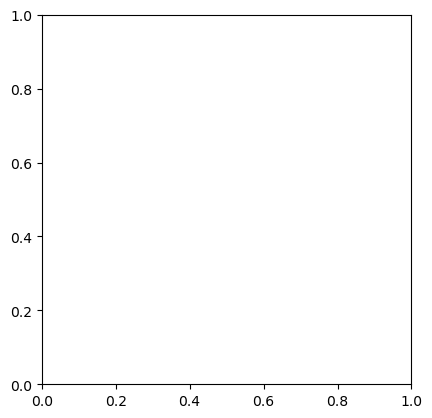

In [17]:
try:
    fig, ax = plt.subplots()
    ax.imshow(data, cmap='gray')
except TypeError as e:
    print(str(e))

The `imshow` function can only display grayscale and RGB(A) 2D images.
We can thus use it to visualize 2D planes. By fixing one axis, we can
observe three different views of the image.



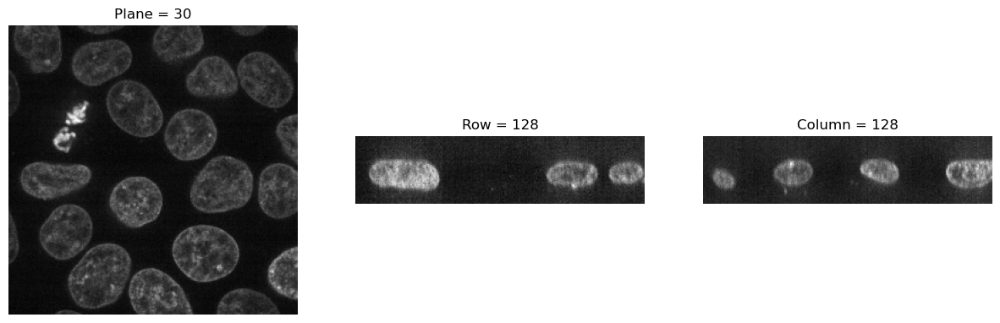

In [18]:
def show_plane(ax, plane, cmap="gray", title=None):
    ax.imshow(plane, cmap=cmap)
    ax.axis("off")

    if title:
        ax.set_title(title)


(n_plane, n_row, n_col) = data.shape
_, (a, b, c) = plt.subplots(ncols=3, figsize=(15, 5))

show_plane(a, data[n_plane // 2], title=f'Plane = {n_plane // 2}')
show_plane(b, data[:, n_row // 2, :], title=f'Row = {n_row // 2}')
show_plane(c, data[:, :, n_col // 2], title=f'Column = {n_col // 2}')

As hinted before, a three-dimensional image can be viewed as a series of
two-dimensional planes. Let us write a helper function, `display`, to create
a montage of several planes. By default, every other plane is displayed.



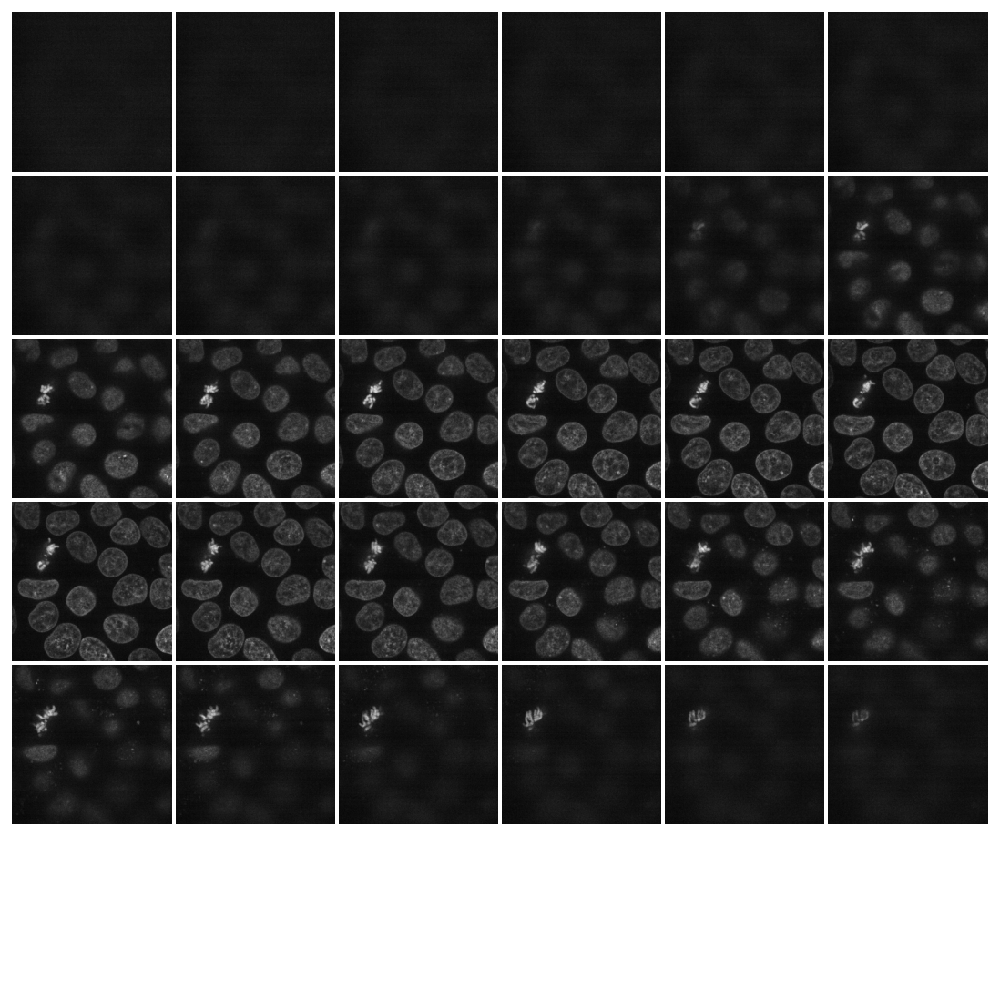

In [19]:
def display(im3d, cmap='gray', step=2):
    data_montage = util.montage(im3d[::step], padding_width=4, fill=np.nan)
    _, ax = plt.subplots(figsize=(16, 14))
    ax.imshow(data_montage, cmap=cmap)
    ax.set_axis_off()


display(data)

Alternatively, we can explore these planes (slices) interactively using
Jupyter widgets. Let the user select which slice to display and show the
position of this slice in the 3D dataset.
Note that you cannot see the Jupyter widget at work in a static HTML page,
as is the case in the online version of this example. For the following
piece of code to work, you need a Jupyter kernel running either locally or
in the cloud: see the bottom of this page to either download the Jupyter
notebook and run it on your computer, or open it directly in Binder. On top
of an active kernel, you need a web browser: running the code in pure Python
will not work either.



In [20]:
def slice_in_3D(ax, i):
    # From https://stackoverflow.com/questions/44881885/python-draw-3d-cube
    Z = np.array([[0, 0, 0],
                  [1, 0, 0],
                  [1, 1, 0],
                  [0, 1, 0],
                  [0, 0, 1],
                  [1, 0, 1],
                  [1, 1, 1],
                  [0, 1, 1]])

    Z = Z * data.shape
    r = [-1, 1]
    X, Y = np.meshgrid(r, r)

    # Plot vertices
    ax.scatter3D(Z[:, 0], Z[:, 1], Z[:, 2])

    # List sides' polygons of figure
    verts = [[Z[0], Z[1], Z[2], Z[3]],
             [Z[4], Z[5], Z[6], Z[7]],
             [Z[0], Z[1], Z[5], Z[4]],
             [Z[2], Z[3], Z[7], Z[6]],
             [Z[1], Z[2], Z[6], Z[5]],
             [Z[4], Z[7], Z[3], Z[0]],
             [Z[2], Z[3], Z[7], Z[6]]]

    # Plot sides
    ax.add_collection3d(
        Poly3DCollection(
            verts,
            facecolors=(0, 1, 1, 0.25),
            linewidths=1,
            edgecolors="darkblue"
        )
    )

    verts = np.array([[[0, 0, 0],
                       [0, 0, 1],
                       [0, 1, 1],
                       [0, 1, 0]]])
    verts = verts * (60, 256, 256)
    verts += [i, 0, 0]

    ax.add_collection3d(
        Poly3DCollection(
            verts,
            facecolors="magenta",
            linewidths=1,
            edgecolors="black"
        )
    )

    ax.set_xlabel("plane")
    ax.set_xlim(0, 100)
    ax.set_ylabel("row")
    ax.set_zlabel("col")

    # Autoscale plot axes
    scaling = np.array([getattr(ax,
                                f'get_{dim}lim')() for dim in "xyz"])
    ax.auto_scale_xyz(* [[np.min(scaling), np.max(scaling)]] * 3)


def explore_slices(data, cmap="gray"):
    from ipywidgets import interact
    N = len(data)

    @interact(plane=(0, N - 1))
    def display_slice(plane=34):
        fig, ax = plt.subplots(figsize=(20, 5))

        ax_3D = fig.add_subplot(133, projection="3d")

        show_plane(ax, data[plane], title=f'Plane {plane}', cmap=cmap)
        slice_in_3D(ax_3D, plane)

        plt.show()

    return display_slice


explore_slices(data)

interactive(children=(IntSlider(value=34, description='plane', max=59), Output()), _dom_classes=('widget-inter…

<function __main__.explore_slices.<locals>.display_slice(plane=34)>

## Adjust exposure
Scikit-image's `exposure` module contains a number of functions for
adjusting image contrast. These functions operate on pixel values.
Generally, image dimensionality or pixel spacing doesn't need to be
considered. In local exposure correction, though, one might want to
adjust the window size to ensure equal size in *real* coordinates along
each axis.



[Gamma correction](https://en.wikipedia.org/wiki/Gamma_correction)
brightens or darkens an image. A power-law transform, where `gamma` denotes
the power-law exponent, is applied to each pixel in the image: `gamma < 1`
will brighten an image, while `gamma > 1` will darken an image.



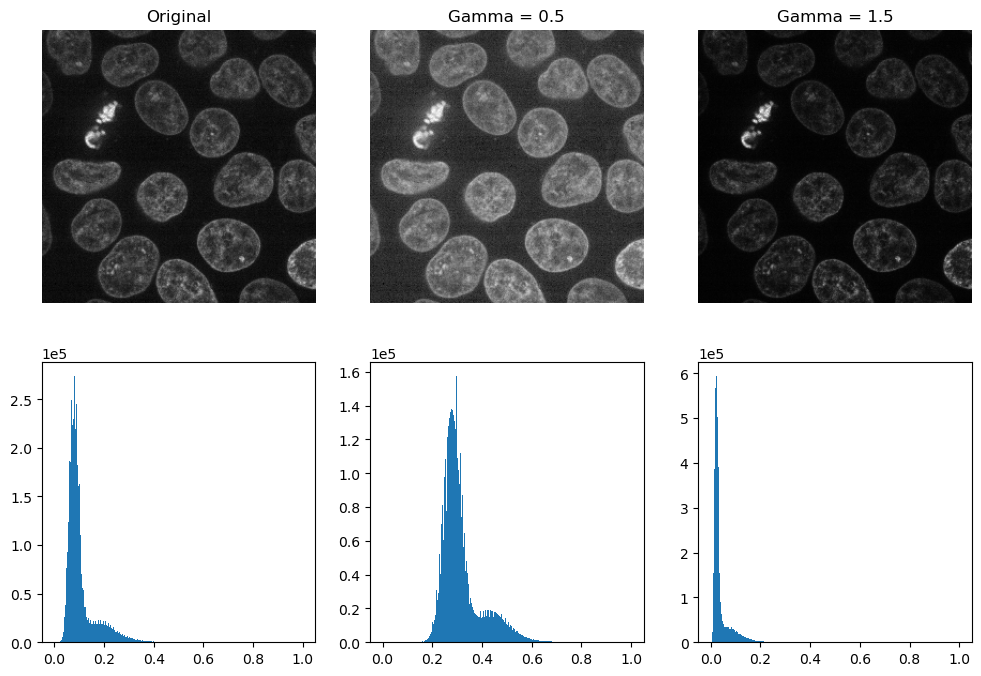

In [21]:
def plot_hist(ax, data, title=None):
    # Helper function for plotting histograms
    ax.hist(data.ravel(), bins=256)
    ax.ticklabel_format(axis="y", style="scientific", scilimits=(0, 0))

    if title:
        ax.set_title(title)


gamma_low_val = 0.5
gamma_low = exposure.adjust_gamma(data, gamma=gamma_low_val)

gamma_high_val = 1.5
gamma_high = exposure.adjust_gamma(data, gamma=gamma_high_val)

_, ((a, b, c), (d, e, f)) = plt.subplots(nrows=2, ncols=3, figsize=(12, 8))

show_plane(a, data[32], title='Original')
show_plane(b, gamma_low[32], title=f'Gamma = {gamma_low_val}')
show_plane(c, gamma_high[32], title=f'Gamma = {gamma_high_val}')

plot_hist(d, data)
plot_hist(e, gamma_low)
plot_hist(f, gamma_high)

[Histogram
equalization](https://en.wikipedia.org/wiki/Histogram_equalization)
improves contrast in an image by redistributing pixel intensities. The most
common pixel intensities get spread out, increasing contrast in low-contrast
areas. One downside of this approach is that it may enhance background
noise.



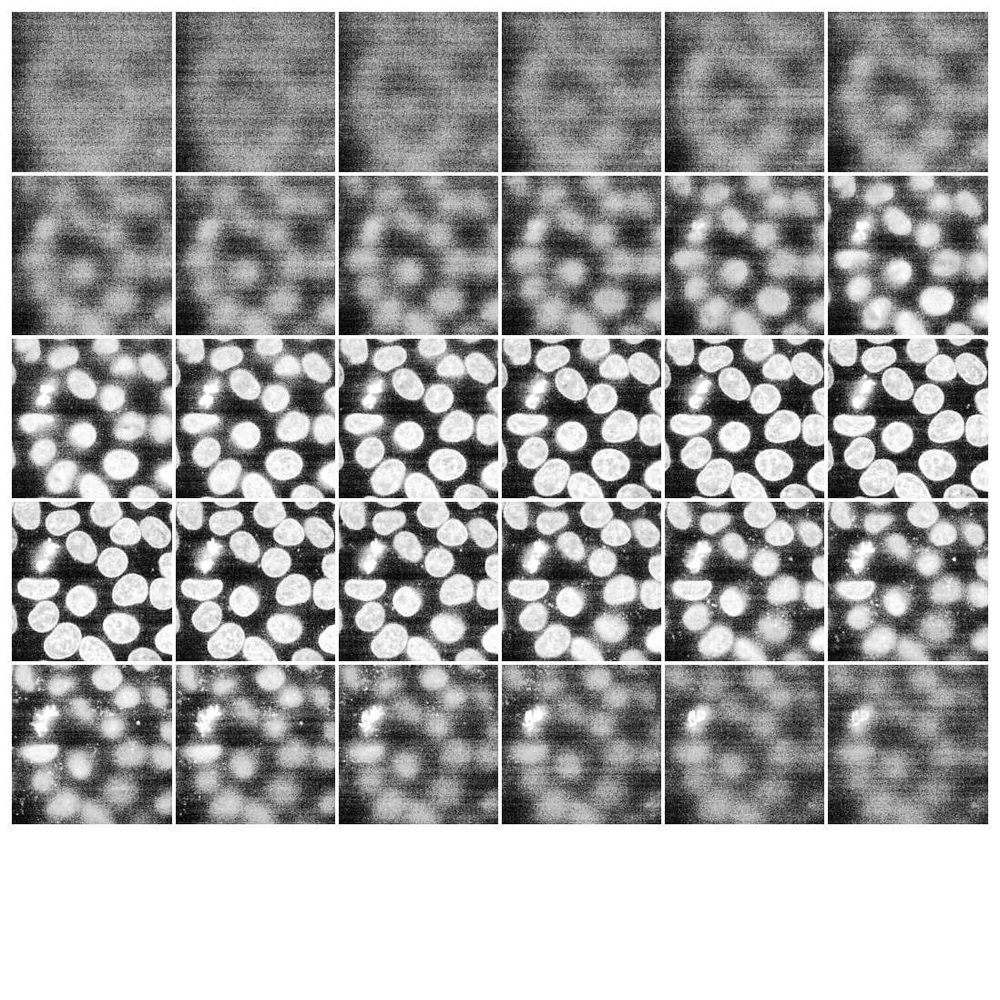

In [22]:
equalized_data = exposure.equalize_hist(data)

display(equalized_data)

As before, if we have a Jupyter kernel running, we can explore the above
slices interactively.



In [23]:
explore_slices(equalized_data)

interactive(children=(IntSlider(value=34, description='plane', max=59), Output()), _dom_classes=('widget-inter…

<function __main__.explore_slices.<locals>.display_slice(plane=34)>

Let us now plot the image histogram before and after histogram equalization.
Below, we plot the respective cumulative distribution functions (CDF).



Text(0.5, 1.0, 'Histogram equalization CDF')

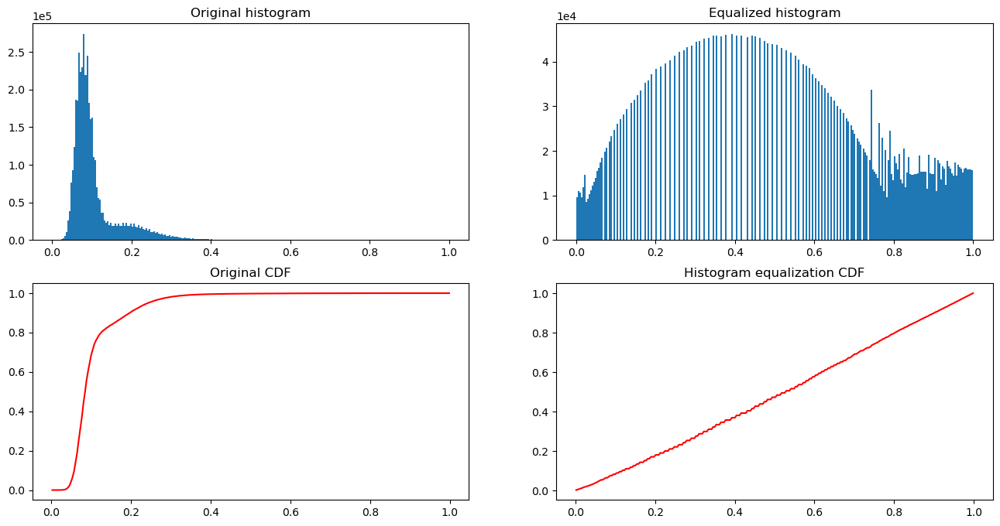

In [24]:
_, ((a, b), (c, d)) = plt.subplots(nrows=2, ncols=2, figsize=(16, 8))

plot_hist(a, data, title="Original histogram")
plot_hist(b, equalized_data, title="Equalized histogram")

cdf, bins = exposure.cumulative_distribution(data.ravel())
c.plot(bins, cdf, "r")
c.set_title("Original CDF")

cdf, bins = exposure.cumulative_distribution(equalized_data.ravel())
d.plot(bins, cdf, "r")
d.set_title("Histogram equalization CDF")

Most experimental images are affected by salt and pepper noise. A few bright
artifacts can decrease the relative intensity of the pixels of interest. A
simple way to improve contrast is to clip the pixel values on the lowest and
highest extremes. Clipping the darkest and brightest 0.5% of pixels will
increase the overall contrast of the image.



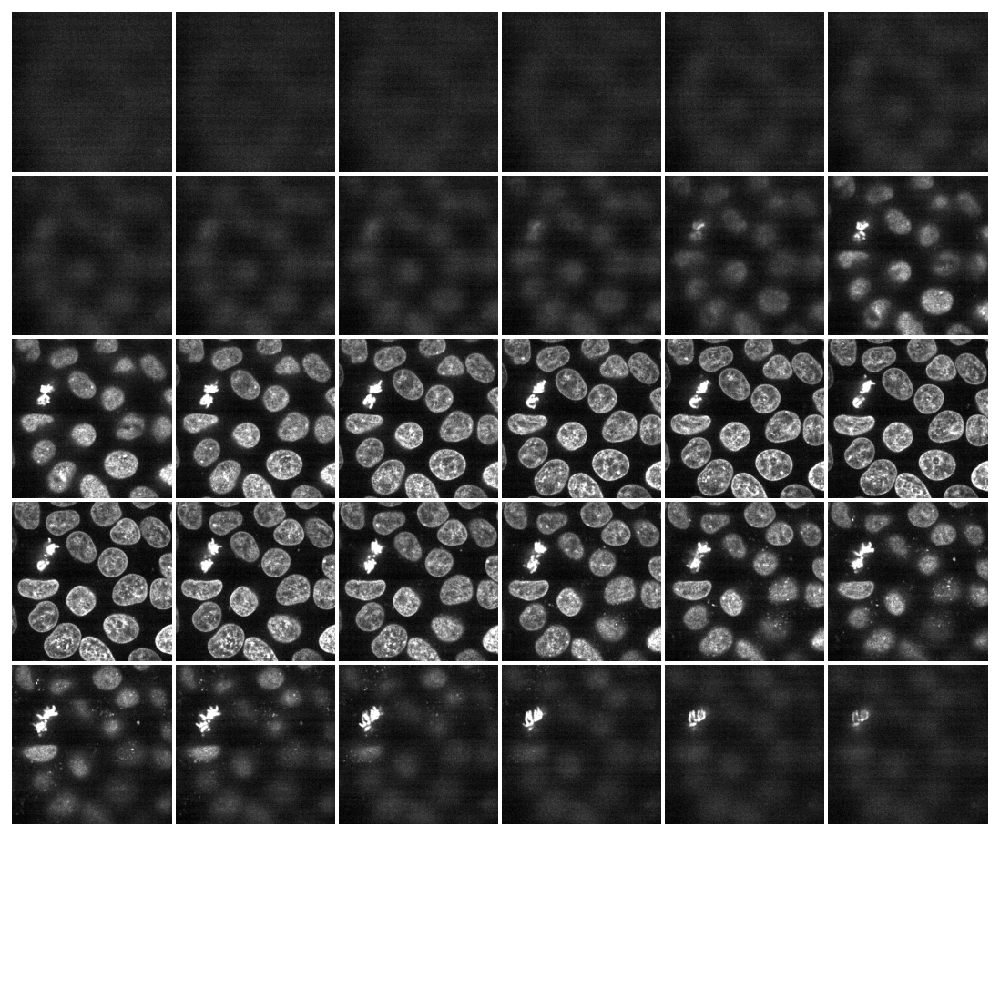

In [25]:
vmin, vmax = np.percentile(data, q=(0.5, 99.5))

clipped_data = exposure.rescale_intensity(
    data,
    in_range=(vmin, vmax),
    out_range=np.float32
)

display(clipped_data)

Alternatively, we can explore these planes (slices) interactively using
[Plotly Express](https://plotly.com/python/sliders/).
Note that this works in a static HTML page!



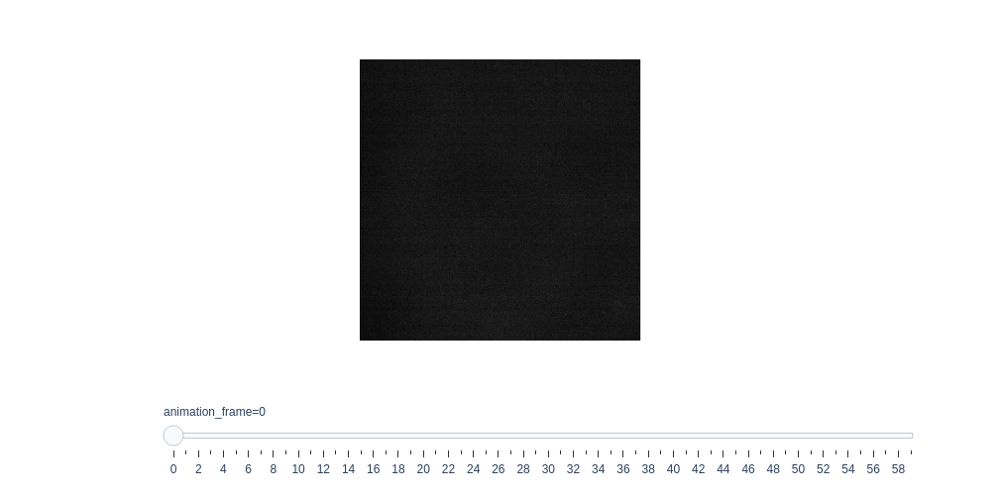

In [26]:
fig = px.imshow(data, animation_frame=0, binary_string=True)
fig.update_xaxes(showticklabels=False)
fig.update_yaxes(showticklabels=False)
fig.update_layout(
    autosize=False,
    width=500,
    height=500,
    coloraxis_showscale=False
)
# Drop animation buttons
fig['layout'].pop('updatemenus')
plotly.io.show(fig)

plt.show()